In [72]:
using Plots, LinearAlgebra;

# Experimento de Young (Crank-Nicolson)
Considera el clásico experimento de Young de la doble rendija. El ancho de cada rendija es $b$ y están separadas a una distancia $h$. Una onda plana monocromática de longitud de onda $\lambda$ incide frontalmente sobre la pantalla formando el patrón de difracción de Fraunhofer. La propagación libre de la onda electromagnética se calcula solucionando la ecuación escalar de onda que en el régimen paraxial toma la forma

\begin{equation}
\frac{\partial^2 U}{\partial x^2} + i2k \frac{\partial U}{\partial z} = 0
\end{equation}

donde $U(x,z)$ es la amplitud del campo eléctrico de la onda, $i$ es el número imaginario $\sqrt{-1}$ y $k=\frac{2\pi}{\lambda}$ es la constante propagación. 

Utilizando el método de Crank-Nicolson se resuelve la ecuación anterior para simular la propagación de la luz. Se toma como campo inicial en $z=0$ la luz que sale justo después de la pantalla con la doble rendija. Para fines numéricos se toma $\lambda=632.8$ $nm$ que corresponde a la longitud de onda de un láser de He-Ne. El rango transversal y longitudinal están definidos en los siguientes intervalos $-6$ $mm \leq x \leq$ $6 mm$ y $ 0 \leq z \leq 1.5$ $m$ respectivamente. El total de puntos transversales $n_x=511$ y puntos longitudinales $n_z=200$. Los datos de la pantalla $h=1$ $mm$ y $b=0.2$  $mm$.

In [62]:
λ=632.8E-9; #E-9 #Longitud de onda (He-Ne) [m]
k=2π/λ; #Constante de propagación
h=1E-3; #Distancia de separación [m]
b=.2E-3; #Ancho de la rendija [m]

nₓ=511; #Puntos transversales
nₛ=200; #Puntos longitudinales
x=collect(range(-6,6,nₓ)).*1E-3; #Rango transversal [m]
z=collect(range(0,1.5,nₛ));#.*1E3; #Rango de propagación [m]

Δx=abs(x[1,1]-x[2,1]);
Δz=abs(z[1,1]-z[2,1]);

α=-(im/(2*k))*(Δz/((Δx)^2)); #Diffusion number 

C = SymTridiagonal(ones(nₓ)*(2*(1+α)), ones(nₓ-1)*-α);
C=convert(Matrix{ComplexF64}, C);
C[1,1]=1; C[1,2]=0;C[nₓ,nₓ]=1;C[nₓ,nₓ-1]=0;#Condiciones de frontera

D = SymTridiagonal(ones(nₓ)*(2*(1-α)), ones(nₓ-1)*α);
D=convert(Matrix{ComplexF64}, D);
D[1,1]=1; D[1,2]=0;D[nₓ,nₓ]=1;D[nₓ,nₓ-1]=0; #Condiciones de frontera

P=inv(C)*D;

In [ ]:
U_raw=[];
U_0=push!(U_raw,((abs.(x).>=(h/2)).&(abs.(x).<=(b+(h/2))))) #Campo óptico inicial 

for i=2:nₛ
    U_raw=push!(U_raw,P*(U_raw[end]))
end

U=reshape(reduce(vcat,U_raw),(nₓ,nₛ));

I=abs.(U).^2;

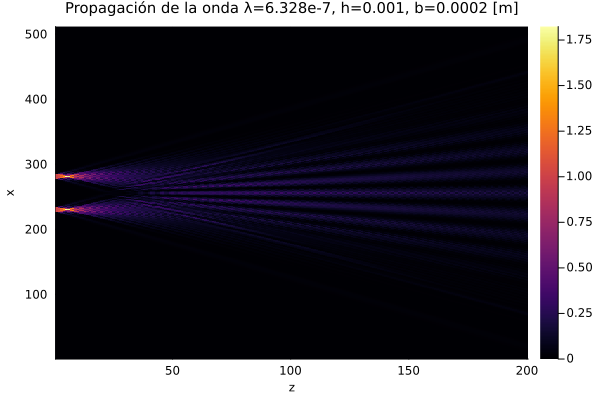

In [46]:
heatmap(I,xlabel="z",ylabel="x",xaxis=font(8),yaxis=font(8),title="Propagación de la onda λ=$λ, h=$h, b=$b [m]",titlefont=font(10))

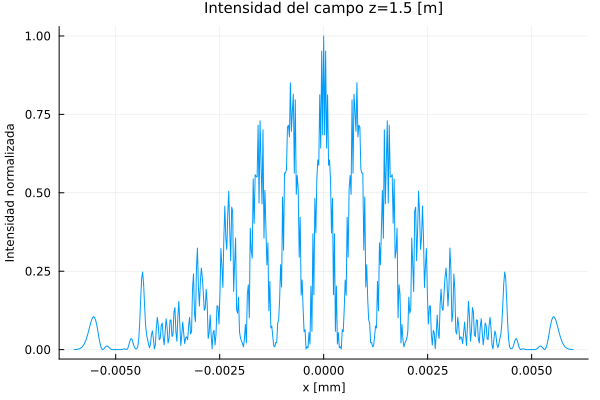

In [47]:
plot(x,I[:,200]./maximum(I[:,200]),legend=false,xlabel="x [mm]",ylabel="Intensidad normalizada"
    ,xaxis=font(8),yaxis=font(8),title="Intensidad del campo z=1.5 [m]",titlefont=font(10))

## Intensidad del campo para diferentes valores de $z$

[ Info: Saved animation to C:\Users\sanjo\Julia_Files\Intensidad de campo (1).gif


Plots.AnimatedGif("C:\\Users\\sanjo\\Julia_Files\\Intensidad de campo (1).gif")
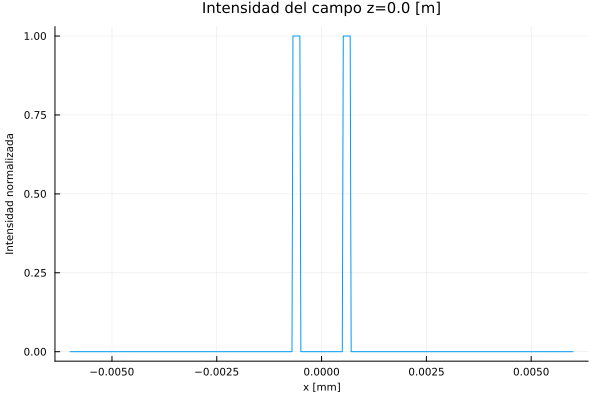

In [44]:
anim= @animate for i=1:nₛ
    z_i=string(round(z[i],digits=3))
    plot(x,I[:,i]./maximum(I[:,i]),legend=false,xlabel="x [mm]",ylabel="Intensidad normalizada"
        ,xaxis=font(7),yaxis=font(7),title="Intensidad del campo z=$z_i [m]",titlefont=font(10))
end
    
gif(anim, "Intensidad de campo (1).gif",fps=10)

## Difracción de Fraunhofer
Ahora se coloca una lente convergente a una distancia $z=0.75$ $m$ cuya distancia focal es de $f=0.75$ $m$. La lente convergente tiene una transmitancia 

\begin{equation}
T_L(x)=e^{-i\frac{k}{2f}x^2}
\end{equation}

In [67]:
f=.75; #Foco de la lente

U_raw=[];
U_0=push!(U_raw,((abs.(x).>=(h/2)).&(abs.(x).<=(b+(h/2))))); #Campo óptico inicial 

for i=2:nₛ/2
    U_raw=push!(U_raw,P*(U_raw[end]))
end

Tₗ=exp.(-im*(k/(2*f))*x.^2) #Transmitancia de una lente convergente
Tₗ[1]=0; Tₗ[511]=0; #Condiciones de frontera
Tₗ;
U_raw[100]=U_raw[100].*Tₗ;

for i=(nₛ/2)+1:nₛ
    U_raw=push!(U_raw,P*(U_raw[end]))
end

U=reshape(reduce(vcat,U_raw),(nₓ,nₛ));
I=abs.(U).^2;

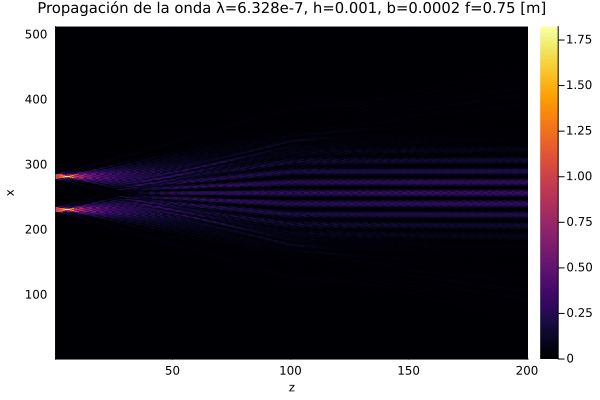

In [68]:
heatmap(I,xlabel="z",ylabel="x",xaxis=font(8),yaxis=font(8),title="Propagación de la onda λ=$λ, h=$h, b=$b f=$f [m]",titlefont=font(10))

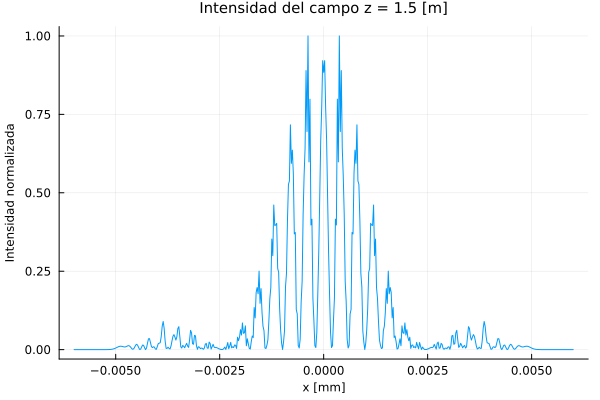

In [71]:
plot(x,I[:,200]./maximum(I[:,200]),legend=false,xlabel="x [mm]",ylabel="Intensidad normalizada"
    ,xaxis=font(8),yaxis=font(8),title="Intensidad del campo z = 1.5 [m]",titlefont=font(10))

## Intensidad del campo para diferentes valores de $z$ con una lente convergente en $z=0.75$ $m$

[ Info: Saved animation to C:\Users\sanjo\Julia_Files\Intensidad de campo (2).gif


Plots.AnimatedGif("C:\\Users\\sanjo\\Julia_Files\\Intensidad de campo (2).gif")
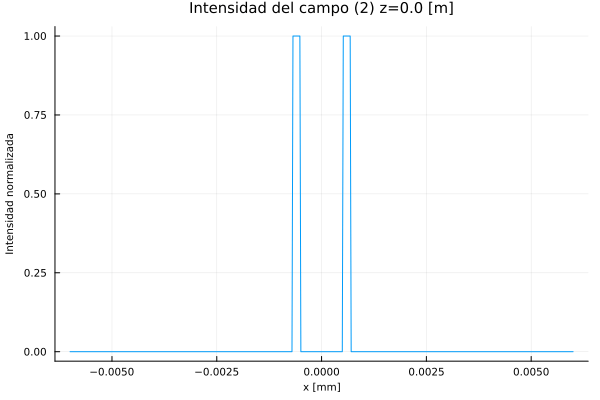

In [70]:
anim= @animate for i=1:nₛ-1
    z_i=string(round(z[i],digits=3))
    plot(x,I[:,i]./maximum(I[:,i]),legend=false,xlabel="x [mm]",ylabel="Intensidad normalizada"
    ,xaxis=font(7),yaxis=font(7),title="Intensidad del campo (2) z=$z_i [m]",titlefont=font(10))
end

gif(anim, "Intensidad de campo (2).gif",fps=10)